<a href="https://colab.research.google.com/github/stefan9988/satellite_image_building_detection/blob/main/Building_Mapping_Spark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Building Mapping


In [1]:
# import necessary libraries
import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import random
import tifffile as tiff
from PIL import Image
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, Concatenate, BatchNormalization, Add
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
!pip install pyspark
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType, ArrayType, FloatType
from pyspark.ml.image import ImageSchema
from pyspark.ml import Pipeline
# from tensorflow.keras import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Concatenate, Dropout

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488493 sha256=75a117f5765c742d56622b159d05475acfb43b76d0e63de0ab623a99ae7dc7bb
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


In [2]:
# connect google drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [3]:
# set the working directory
import os
os.chdir(r'/content/gdrive/MyDrive/archive')

## Loading images using Spark

In [4]:
# Initialize Spark session
spark = SparkSession.builder.master("local[*]").appName("Building_mapping").getOrCreate()

# Read image paths into a DataFrame
# train_x_df = spark.createDataFrame([(path,) for path in sorted(glob.glob('train/*_image.tif'))], ["img_path"])
# train_y_df = spark.createDataFrame([(path,) for path in sorted(glob.glob('train/*_label.tif'))], ["img_path"])

# Define the path to your image dataset
train_img = "train/*_image.tif"
train_label = "train/*_label.tif"
test_img = "test/*_image.tif"
test_label = "test/*_label.tif"

# Load the image dataset
train_img_df = spark.read.format("image").load(train_img)
train_label_df = spark.read.format("image").load(train_label)
test_img_df = spark.read.format("image").load(test_img)
test_label_df = spark.read.format("image").load(test_label)


train_img_np = np.array(train_img_df.select("image.data").rdd.flatMap(lambda x: x).collect())
train_img_np = train_img_np.reshape(-1, 128, 128, 3)

train_label_np = np.array(train_label_df.select("image.data").rdd.flatMap(lambda x: x).collect())
train_label_np = train_label_np.reshape(-1, 128, 128, 1)

test_img_np = np.array(test_img_df.select("image.data").rdd.flatMap(lambda x: x).collect())
test_img_np = test_img_np.reshape(-1, 128, 128, 3)

test_label_np = np.array(test_label_df.select("image.data").rdd.flatMap(lambda x: x).collect())
test_label_np = test_label_np.reshape(-1, 128, 128, 1)

# Stop the Spark session
spark.stop()


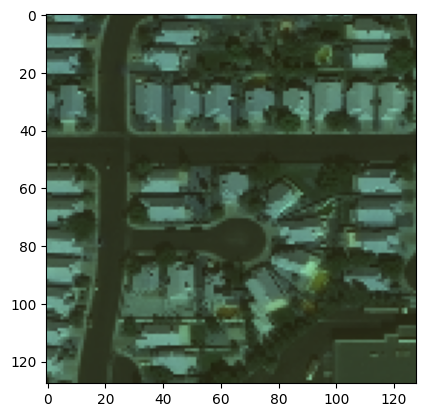

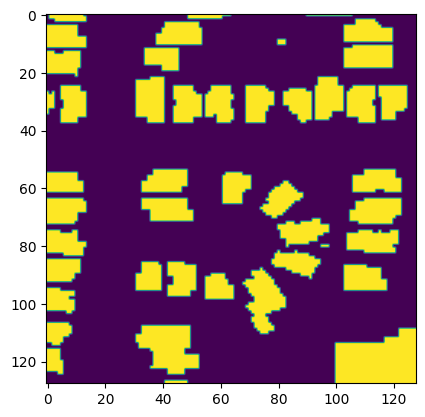

In [5]:
plt.imshow(train_img_np[3, :, :, :].astype('uint8'))
plt.show()
plt.imshow(train_label_np[3, :, :, :].astype('uint8'))
plt.show()

## Create model

In [6]:
def create_model():
  x_in = tf.keras.layers.Input(shape=(128, 128, 3))

  '''Encoder'''
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_in)
  x_temp = tf.keras.layers.Dropout(0.2)(x_temp)
  x_skip1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip1)
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.2)(x_temp)
  x_skip2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip2)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.2)(x_temp)
  x_skip3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip3)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.1)(x_temp)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)

  '''Decoder'''
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.2)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip3])
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.1)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip2])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.2)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip1])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.1)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)

  '''Use 1 by 1 Convolution to get desired output bands'''
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_out = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x_temp)
  # use sigmoid activation here because output values are either 0 or 1

  model = tf.keras.models.Model(inputs=x_in, outputs=x_out)
  return model

## Main Model Training

In [7]:
checkpoint_callback = ModelCheckpoint(
    filepath='spark_model_weights.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [8]:
model = create_model()
model.compile(loss='binary_crossentropy', optimizer='adam')

In [9]:
# training model
history = model.fit(train_img_np,train_label_np, validation_data=(test_img_np, test_label_np), epochs=50, batch_size=20, callbacks=[checkpoint_callback], verbose=1)

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1750
Epoch 1: val_loss improved from inf to 0.68323, saving model to spark_model_weights.h5
4/4 [==============================] - 20s 2s/step - loss: 1.1750 - val_loss: 0.6832
Epoch 2/50


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


3/4 [=====================>........] - ETA: 0s - loss: 0.6401
Epoch 2: val_loss improved from 0.68323 to 0.60454, saving model to spark_model_weights.h5
4/4 [==============================] - 1s 139ms/step - loss: 0.6402 - val_loss: 0.6045
Epoch 3/50
3/4 [=====================>........] - ETA: 0s - loss: 0.6082
Epoch 3: val_loss improved from 0.60454 to 0.58915, saving model to spark_model_weights.h5
4/4 [==============================] - 1s 150ms/step - loss: 0.6035 - val_loss: 0.5892
Epoch 4/50
3/4 [=====================>........] - ETA: 0s - loss: 0.5705
Epoch 4: val_loss did not improve from 0.58915
4/4 [==============================] - 0s 100ms/step - loss: 0.5775 - val_loss: 0.5894
Epoch 5/50
3/4 [=====================>........] - ETA: 0s - loss: 0.5647
Epoch 5: val_loss improved from 0.58915 to 0.55037, saving model to spark_model_weights.h5
4/4 [==============================] - 1s 149ms/step - loss: 0.5622 - val_loss: 0.5504
Epoch 6/50
3/4 [=====================>........] - E

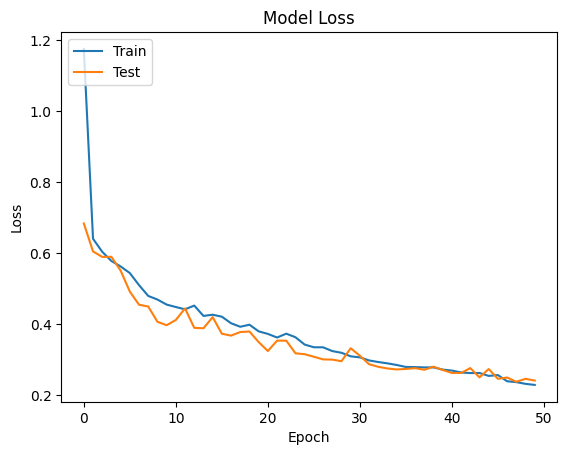

In [10]:
# plot model loss over training and validation data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## NS image


In [11]:
# Assuming you have the path to the image stored in 'ns'
ns_path = '/content/gdrive/MyDrive/archive/SnimakNS.tif'

# Load the image using PIL
img = tiff.imread(ns_path)

# Convert the image to a NumPy array
ns_array = np.array(img)

# Print the shape, minimum, and maximum values
print("Shape of the array:", ns_array.shape)
print("Minimum value:", np.min(ns_array))
print("Maximum value:", np.max(ns_array))

Shape of the array: (5911, 10657, 5)
Minimum value: 0
Maximum value: 255


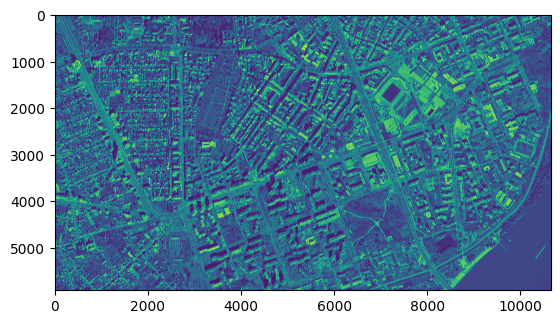

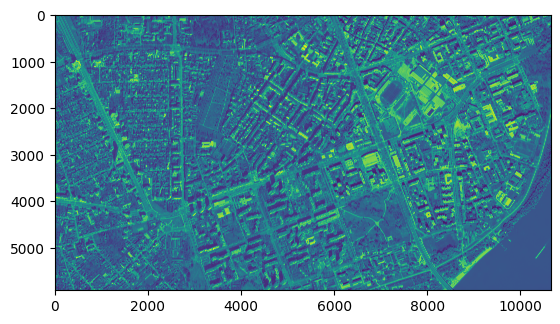

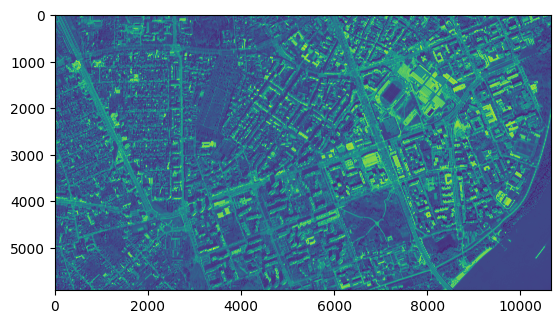

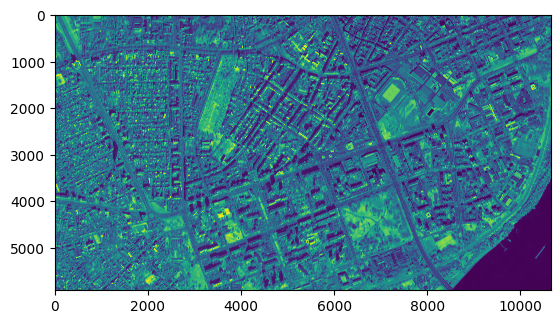

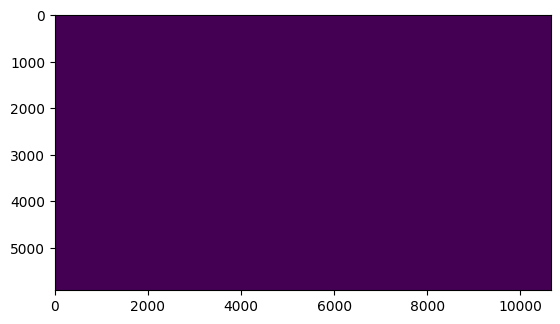

In [12]:
for i in range(5):
  plt.imshow(ns_array[:, :, i])
  plt.show()

# 5 ti kanal ima vrednost 255 za svaki piksel

In [13]:
def split_image(input_image_path, size=128):
    img = tiff.imread(input_image_path)
    height, width, num_channels = img.shape

    num_rows = height // size
    num_cols = width // size

    result_array = np.zeros((num_rows * num_cols, size, size, num_channels), dtype=img.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = img[top:bottom, left:right, channel]
                result_array[idx, :, :, channel] = cropped_img

            # plt.imshow(result_array[idx,:,:,:3])
            # plt.show()
            idx += 1

    return result_array[:,:,:,:3],num_rows,num_cols

In [14]:
def reconstruct_image(result_array, num_rows, num_cols, size=128):
    num_samples, size, _, num_channels = result_array.shape

    reconstructed_image = np.zeros((num_rows * size, num_cols * size, num_channels), dtype=result_array.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = result_array[idx, :, :, channel]
                reconstructed_image[top:bottom, left:right, channel] = cropped_img

            idx += 1

    return reconstructed_image

In [15]:
def save_img(sample_array,img_name,grayscale = False):
  if grayscale:
    sample_array = sample_array * 255
    image = Image.fromarray(sample_array.squeeze(), mode='L')
  else:
    image = Image.fromarray(sample_array.astype('uint8'))

  image.save(f'{img_name}.png')

In [16]:
ns_splited,num_rows,num_cols = split_image(ns_path)
print(ns_splited.shape)

(3818, 128, 128, 3)


In [18]:
model = create_model()
model.load_weights('spark_model_weights.h5')

In [19]:
threshold = 0.5

# prediction of the output
pred_ns = model.predict(ns_splited)
pred_ns = (pred_ns > threshold).astype(np.uint8)

120/120 [==============================] - 7s 28ms/step


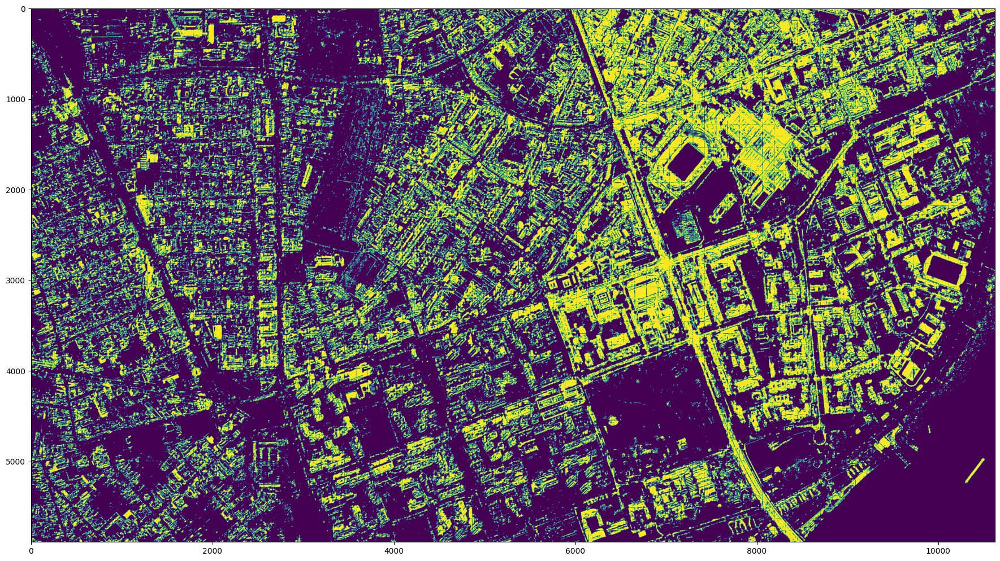

In [22]:
reconstructed_image = reconstruct_image(pred_ns,num_rows,num_cols)
plt.figure(figsize=(22, 20))
plt.imshow(reconstructed_image)
plt.show()
save_img(reconstructed_image,'NS_th_05_spark', True)

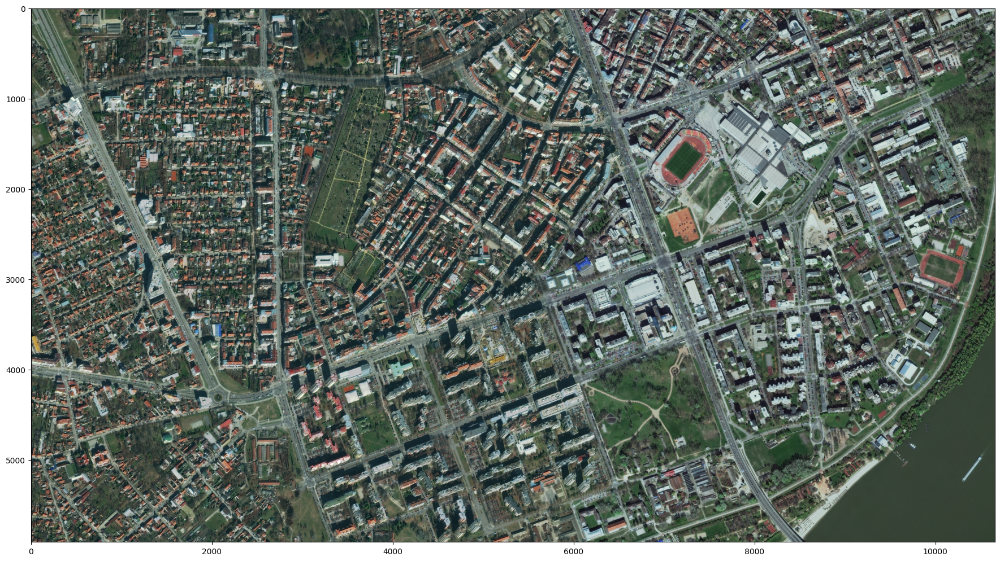

In [21]:
plt.figure(figsize=(22, 20))
plt.imshow(ns_array[:, :, :3])
plt.show()
# save_img(ns_array[:, :, :3],'NS_RGB')

## Filtering


In [23]:
import cv2
import numpy as np

def remove_noise_binary(image_path, kernel_size=3, save_path=None):
    # Read the binary image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply a median filter to remove noise
    filtered_image = cv2.medianBlur(image, kernel_size)

    # Threshold the filtered image to get a binary result
    _, binary_result = cv2.threshold(filtered_image, 127, 255, cv2.THRESH_BINARY)

    if save_path:
        cv2.imwrite(save_path, binary_result)


    return binary_result

In [24]:
from google.colab.patches import cv2_imshow
# Example usage:
input_image_path = 'NS_th_05_spark.png'
output_image = remove_noise_binary(input_image_path, 15, 'NS_th_05_spark_filtered.png')

cv2_imshow(output_image)
cv2.waitKey(0)
cv2.destroyAllWindows()